# 基于YOLOv2的人检测

## 1. YOLO简介
* YOLO全称是：You Only Look Once：Unified, Real-Time Object Detection，是一种支持端到端训练和测试的卷积神经网络，在保证一定准确率的前提下能实现图像中多目标的检测与识别。
* YOLO的优点：
    * 检测范围广：YOLO9000 覆盖了9000种常用分类，YOLOv2 覆盖了PASCAL VOC和COCO数据集分类。
    * 检测准确率高.
    * 检测速度快：平民玩家用普通CPU就能运行低配乞丐版（Tiny YOLO），人民币玩家用GPU运行高配豪华版 (YOLOv2)。**作者大神给出的参考值是 Tiny YOLO 可以达到200FPS，YOLOv2 达到40FPS**，当然这是用 NVIDIA Titan X 传奇装备跑出来的分数。
* YOLO的缺点：
    * YOLO对相互靠的很近的物体，还有很小的群体 检测效果不好，这是因为一个网格中只预测了两个框，并且只属于一类。
    * 对测试图像中，同一类物体出现的新的不常见的长宽比和其他情况表现得不理想，泛化能力偏弱。
    * 由于损失函数的问题，定位误差是影响检测效果的主要原因，尤其是对小物体的处理上，还有待加强。

## 2. YOLO的检测方法
![](https://img-blog.csdn.net/20161229111326609?watermark/2/text/aHR0cDovL2Jsb2cuY3Nkbi5uZXQvSmVzc2VfTXg=/font/5a6L5L2T/fontsize/400/fill/I0JBQkFCMA==/dissolve/70/gravity/SouthEast)
* 给一个输入图像，首先将图像划分成7 * 7的网格。
* 对于每个网格，每个网格预测2个bouding box（每个box包含5个预测量）以及20个类别概率，总共输出7×7×（2*5+20）=1470个tensor.
* 根据上一步可以预测出7 * 7 * 2 = 98个目标窗口，然后根据阈值去除可能性比较低的目标窗口，再由NMS去除冗余窗口即可。

YOLO使用了end-to-end的回归方法，没有region proposal步骤，直接回归便完成了位置和类别的判定.

## 3. 怎样获取YOLO
* **Step 1.** Git 获取 YOLO 代码，命令行输入：`git clone https://github.com/pjreddie/darknet`.
* **Step 2.** 因为是用C++写的，所以需要编译下载后的 YOLO 代码，命令行输入:`cd darknet1`和`make`.
编译成功后，发现 darknet 根目录下多了两个文件 libdarknet.so 和 libdarknet.a
* **Step 3.** 下载 weights 文件
    * YOLO作者大神已经为我们准备好了YOLO不同的版本，先下载其中两个最具代表版本 Tiny YOLO（低配乞丐版） 和 YOLOv2（高配豪华版），每一个版本都由两个文件配对组成. 

    * cfg 文件：模型参数配置文件。该文件已经随源代码一起下载下来，保存在cfg目录。

    * weights 文件：模型学习好的权重文件。链接在此请戳：[ tiny-yolo.weights](https://link.zhihu.com/?target=https%3A//pan.baidu.com/s/1u6MXhOciSF3hd1FHFzdANg) 和 [yolo.weights](https://link.zhihu.com/?target=https%3A//pan.baidu.com/s/1DB2k1pFxEMg3mBa-xY8BvQ)
    

## 4. 怎样使用YOLO
主要有两种使用方式：命令行调用和python调用
### 4.1  命令行方式
* 先试试高配豪华版 YOLOv2，运行过程会有点慢，但准确率很高，命令行输入：`./darknet detect cfg/yolo.cfg weights/yolo.weights data/dog.jpg`.
* 再试试低配乞丐版 Tiny YOLO，运行过程很快，以损失一些准确率作为代价，命令行输入：`./darknet detect cfg/tiny-yolo.cfg weights/tiny-yolo.weights data/dog.jpg`.
    
在 darknet 根目录下会生成一张结果图片 predictions.png，操作不太友好的是识别不同图片永远都只会生成同一个结果图片文件名，并且覆盖之前的结果图片。如下图所示：<br>
![](https://pic1.zhimg.com/80/v2-cafbc6d04a81ed2f01e82f09e72962ca_hd.jpg)
### 4.2 用python去调用
调用YOLO的原理本质是调用编译好的库文件 libdarknet.so 里的方法。**Python ctypes**能帮助我们使用Python调用C++库里的方法，这里还是要感谢作者大神已经为我们写好了 python/darknet.py，该文件的作用是把YOLO库中的C++方法一一翻译成Python方法并封装成Python模块，让我们完全可以忽略C++部分，只需要实现调用Python方法即可。

## 5. 怎样数一张照片里的人头
这个问题可以转换成人脸或是人头或是人的监测。本方法是基于YOLO的人监测，然后再数有多少个人。
### 准备工作
* 本方法是使用GPU实现的，因此需要先将Makefile文件里`GPU`和`CUDNN`都置于1，然后再在根目录下命令行输入：`make`，重新编译。
* 由于本方法只用检测人，因此需要更改你所选用的`/cfg/*.data`文件里的内容，比如我选用的是`/cfg/coco.data`，那么需要修改三处地方:
    * 1. 类的数目量改为1：`classes = 1`.
    * 2. 保存Label名称的文件路径要正确：`names = ../data/coco.names`.
    * 3. 保存Label名称的文件(`../data/coco.names`)要修改为只有`person`一个label，因为我们只检测人。
* 建议使用python的方式调用，这样比较灵活，可以看到我写的`PersonDetect.py`文件，里面介绍了怎样加载权重weights和配置文件cfg，以及怎样调用大神写的`darknet.py`.

## 6. 展示

### 导入必须的库文件

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import shutil
import matplotlib.image as pltimg
from PersonDetect import *
from ImageProcess import *
from PersonCount import *
%matplotlib inline

### opencev跟matplotlib读取图片类型的转换

In [2]:
def cv2plt(img):
    (r,g,b) = cv2.split(img)
    return cv2.merge([b,g,r])

### 第一次尝试

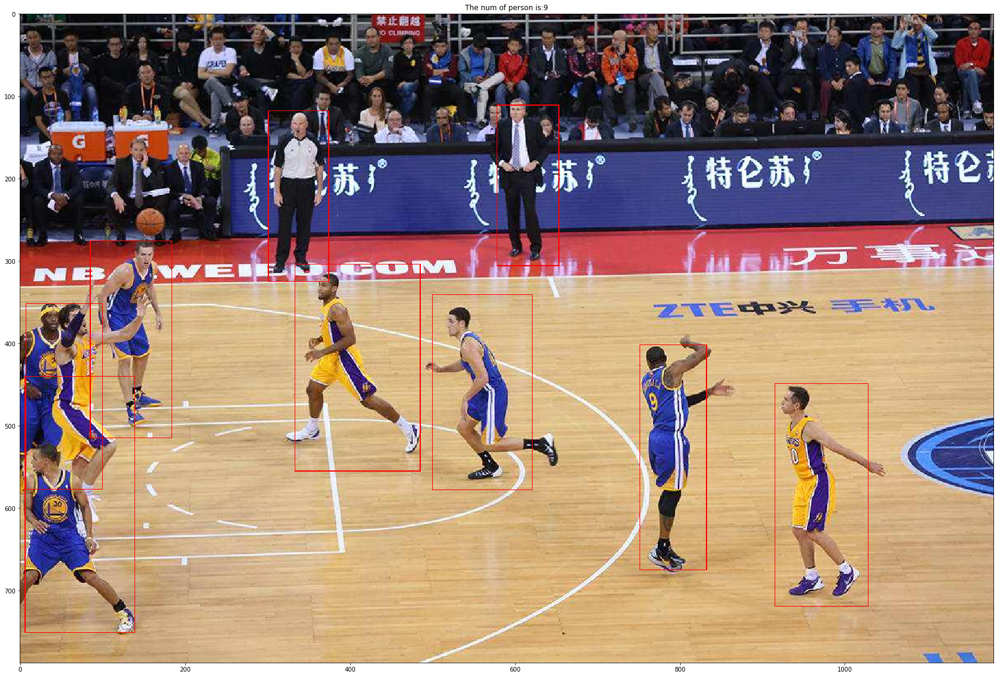

In [4]:
#s2
#b5
originImageName = "b5.jpg"
plt.figure(figsize=(30,20))
personNum = PersonCount(originImageName, ProbThre=0.5, nms=0.5, is_split=False, subImageLen = 200)
image_ori_copy = cv2.imread(os.path.join("Result", originImageName.split(
        '.')[0] + '.png'))
plt.imshow(cv2plt(image_ori_copy))
plt.title("The num of person is:"+str(personNum))
plt.show()

### 第二次尝试：Add a trick

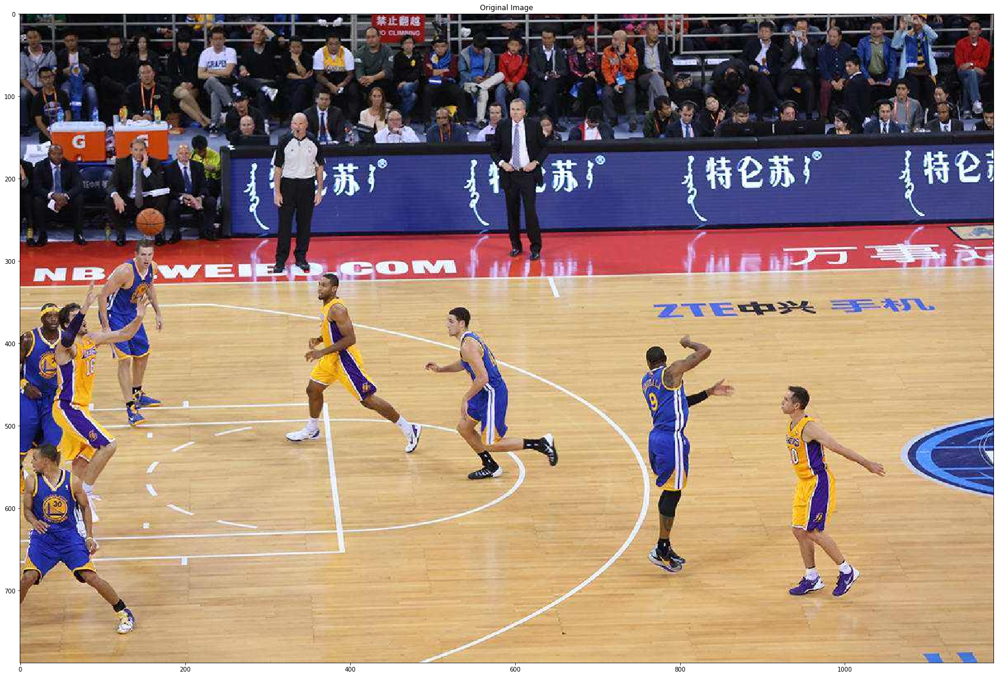

In [5]:
originImageName = "b5.jpg"
srcpicture_path = "OriginalImages/"+originImageName
dstpictureDir = 'ProcessedImages/'
for fileDir in os.listdir(dstpictureDir):
    shutil.rmtree(os.path.join(dstpictureDir,fileDir))
    os.mkdir(os.path.join(dstpictureDir,fileDir))
plt.figure(figsize=(30,20))
image_ori = cv2.imread(srcpicture_path)
subImageLen = 200
piex_thresh = 10
heigth_split_num = image_ori.shape[0]//subImageLen
width_split_num = image_ori.shape[1]//subImageLen
plt.imshow(cv2plt(image_ori))
plt.title("Original Image")
plt.show()

#### 分割图片 

In [6]:
SplitImage(srcpicture_path, heigth_split_num, width_split_num)

#### 显示分割的图片

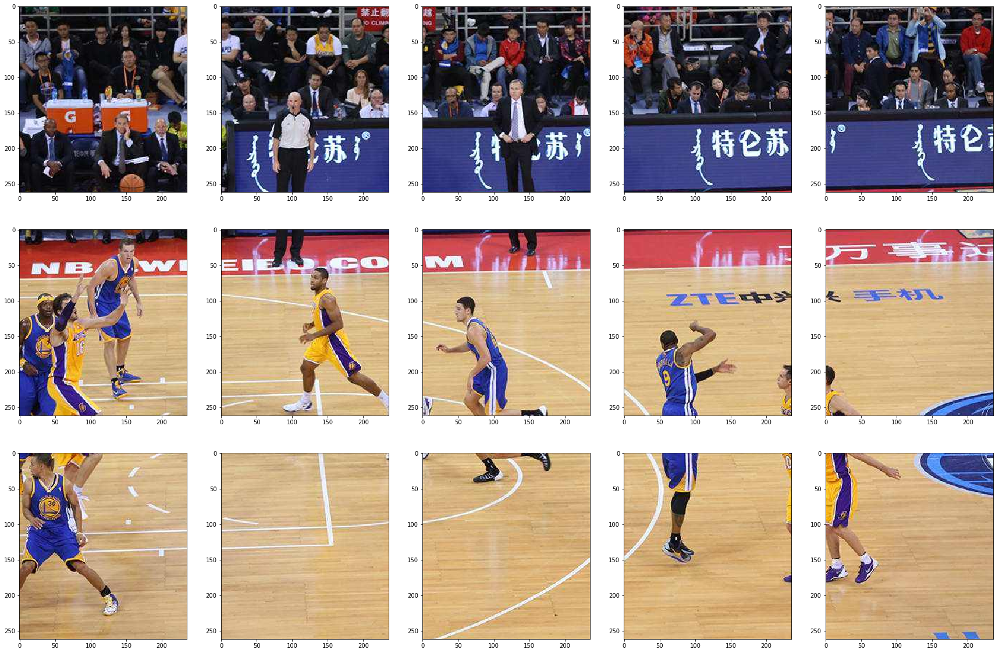

In [8]:
plt.figure(figsize=(30,20))
plt.title("Split image")
for i in range(heigth_split_num):
    for j in range(width_split_num):
        plt.subplot(heigth_split_num,width_split_num,i*width_split_num+j+1)
        img = cv2.imread(os.path.join(dstpictureDir,"SplitedImages",str(i+1)+str(j+1)+".png"))
        plt.imshow(cv2plt(img))
plt.show()

#### 將分割的圖片分別檢測

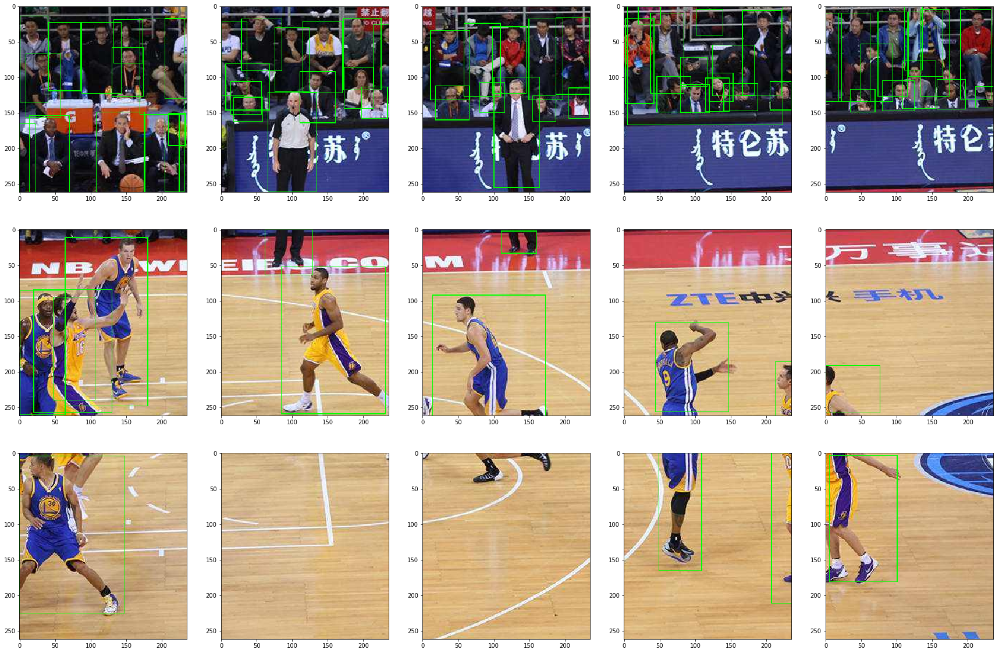

In [9]:
plt.figure(figsize=(30,20))
plt.title("SplitImage_DrawRect")
SplitImageDict = {}
for i in range(heigth_split_num):
    for j in range(width_split_num):
        plt.subplot(heigth_split_num,width_split_num,i*width_split_num+j+1)
        imgsplitPath = os.path.join(dstpictureDir,"SplitedImages",str(i+1)+str(j+1)+".png")
        personDict = detectPerson(imgsplitPath, thresh=.3, hier_thresh=.5, nms=0.5)
        SplitImageDict[str(i+1)+str(j+1)+".png"] = personDict
        #print(personDict)
        img_tmp = cv2.imread(imgsplitPath).copy()
        for key in list(personDict.keys()):
            (x,y,w,h) = personDict[key]
            cv2.rectangle(img_tmp,(x,y),(x+w,y+h),(0,255,0),1)
        cv2.imwrite(os.path.join(dstpictureDir,"SplitedImages_DrawRect",str(i+1)+str(j+1)+".png"),img_tmp)
        plt.imshow(cv2plt(img_tmp))
plt.show()

#### 将分割的图片合并起来

In [10]:
BoxDict_Perfect = UnitedImage(srcpicture_path, SplitImageDict, heigth_split_num, width_split_num, piex_thresh)

#### 显示最终的监测结果

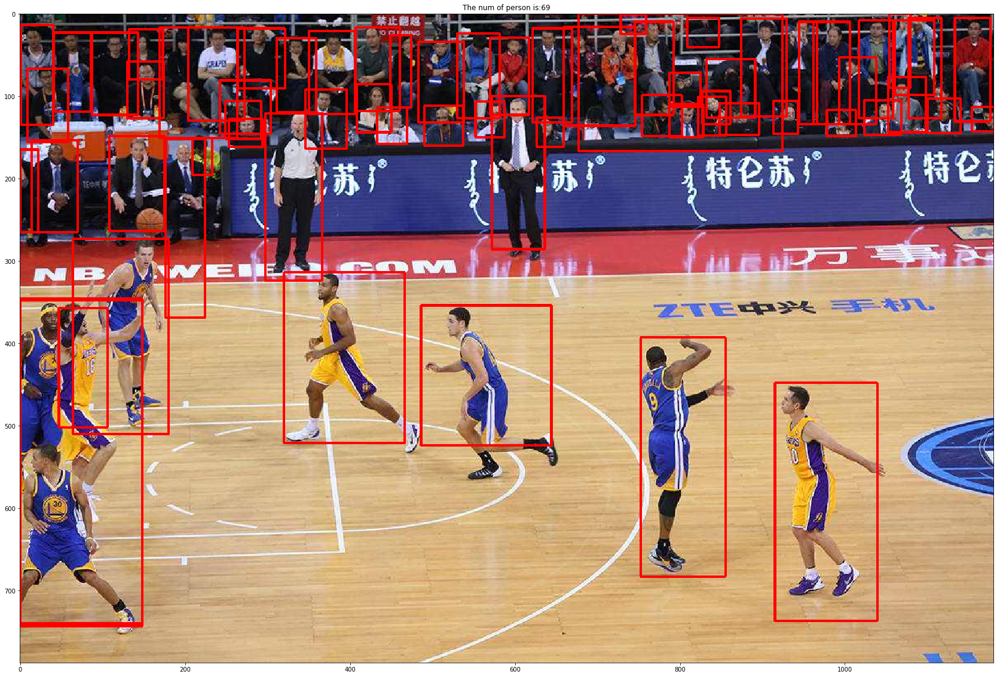

In [11]:
plt.figure(figsize=(30,20))
personNum = 0 
image_ori_copy = image_ori.copy()
for key in list(BoxDict_Perfect.keys()):
    BoxList_Perfect = BoxDict_Perfect[key]
    for box in BoxList_Perfect:
        [x,y,w,h] = box
        cv2.rectangle(image_ori_copy,(int(x),int(y)),(int(x+w),int(y+h)),(0,0,255),2)  
        personNum +=1
cv2.imwrite(os.path.join("Result",originImageName.split('.')[0]+'.png'),image_ori_copy)
plt.imshow(cv2plt(image_ori_copy))
plt.title("The num of person is:"+str(personNum))
plt.show()

## 7. 将上面的代码封装

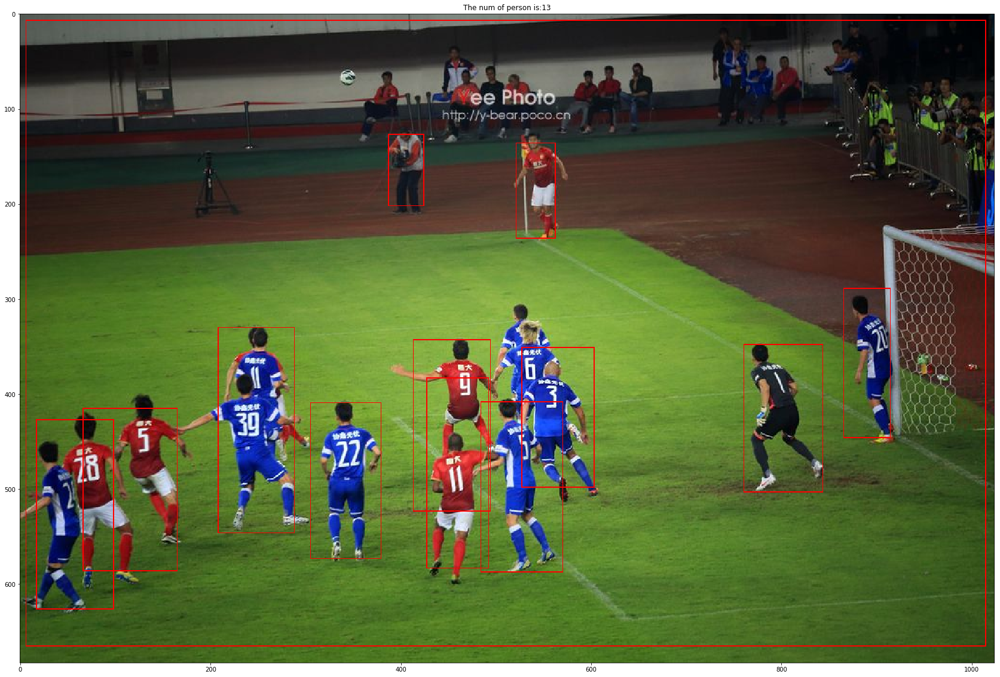

In [18]:
#b3.jpg
#f2.jpg
#s5.jpg
#test.JPG (not good)
#s1 s2(good without split)
originImageName = "f2.jpg"
plt.figure(figsize=(30,20))
#根据不同场景下调整ProbThre（判断为人的概率）和 nms（NMS的IOU阈值）
personNum = PersonCount(originImageName,ProbThre=0.4, nms=0.5, is_split=False, subImageLen = 200)
image_ori_copy = cv2.imread(os.path.join("Result", originImageName.split(
        '.')[0] + '.png'))
plt.imshow(cv2plt(image_ori_copy))
plt.title("The num of person is:"+str(personNum))
plt.show()

## 8. 一点想法...
* 将图片分割后先做一些图像处理，再输入模型预测。
* 把bounding box面积大的区域重新放进去检测以提高精度。
* 基于YOLO训练自己的模型，但是需要数据。
* 人脸检测->[tiny face](https://github.com/cydonia999/Tiny_Faces_in_Tensorflow)